Here some proof of principles how the code works. we build a FluidExperiment object from a path and groups, and then we can drop positions form it, copy it to new objects and perform other operations.

In [2]:
#DEFAULTS

INTEGRATION_GROWTHRATE = 5

In [2]:

from fluid_experiment.fluid_experiment import FluidExperiment

path_experiment = "/Users/lukasv/DATA/midap/FluidPhage_REP1_results"
groups = ["CFP","YFP"]

import os
a = os.listdir(path_experiment)
print(a)
experiment_test = FluidExperiment(path_experiment, color_channels= groups)

print(experiment_test)
experiment_test.drop_positions(positions= [f"pos{i}" for i in range(1,16)])
print(experiment_test)

experiment_test2 = FluidExperiment.from_copy(experiment_test)
print(experiment_test2)

['pos6', 'pos1', 'pos8', '.DS_Store', 'pos15', 'pos12', 'pos9', 'pos7', 'pos13', 'pos14', 'pos18', 'pos11', 'pos16', 'pos2', 'pos5', 'pos17', 'pos10', 'pos4', 'pos3']
['pos6', 'pos1', 'pos8', 'pos15', 'pos12', 'pos9', 'pos7', 'pos13', 'pos14', 'pos18', 'pos11', 'pos16', 'pos2', 'pos5', 'pos17', 'pos10', 'pos4', 'pos3']
Loading sample at position pos1 for group CFP
Loading sample at position pos1 for group YFP
Loading sample at position pos2 for group CFP
Loading sample at position pos2 for group YFP
Loading sample at position pos3 for group CFP
Loading sample at position pos3 for group YFP
Loading sample at position pos4 for group CFP
Loading sample at position pos4 for group YFP
Loading sample at position pos5 for group CFP
Loading sample at position pos5 for group YFP
Loading sample at position pos6 for group CFP
Loading sample at position pos6 for group YFP
Loading sample at position pos7 for group CFP
Loading sample at position pos7 for group YFP
Loading sample at position pos8 for

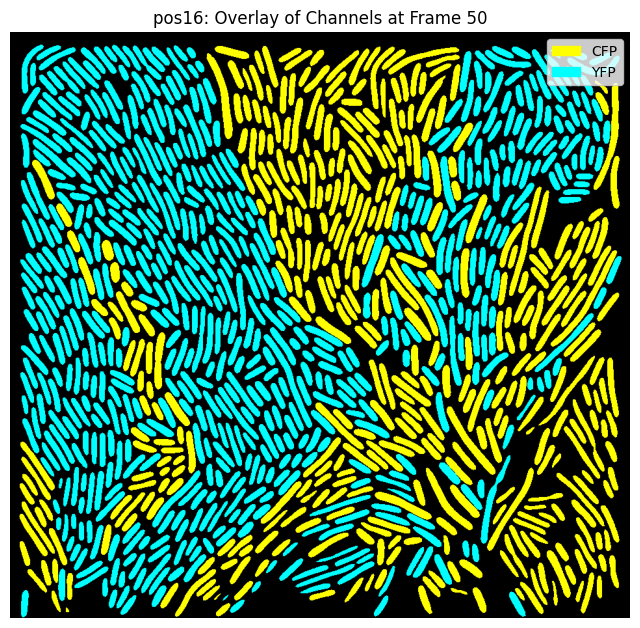

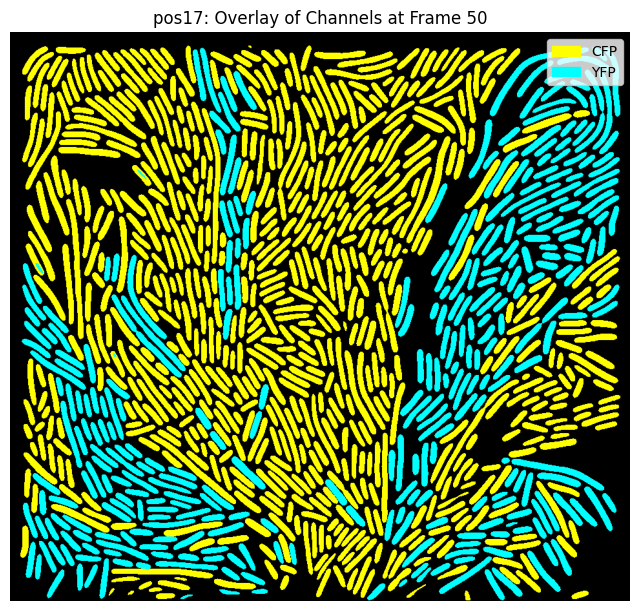

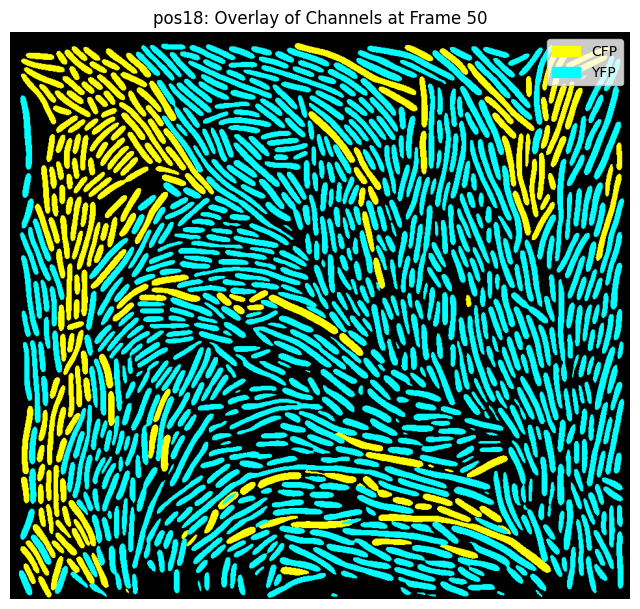

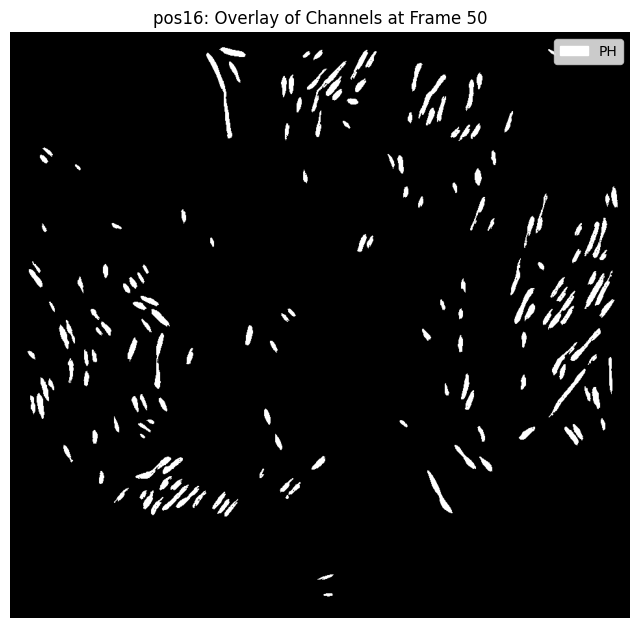

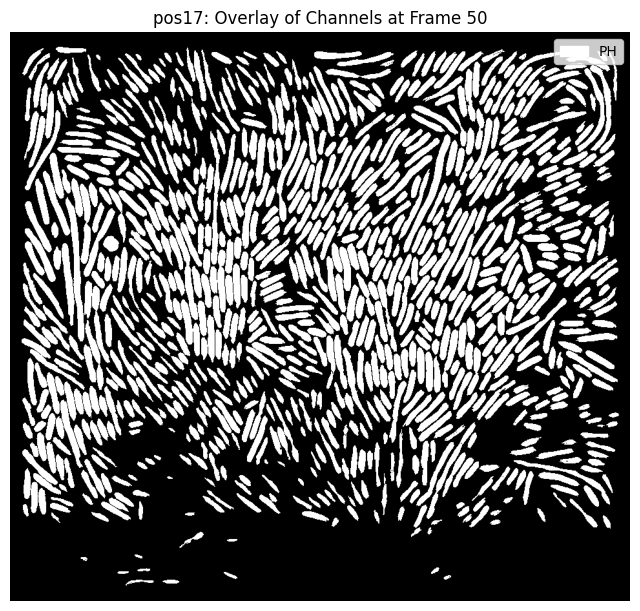

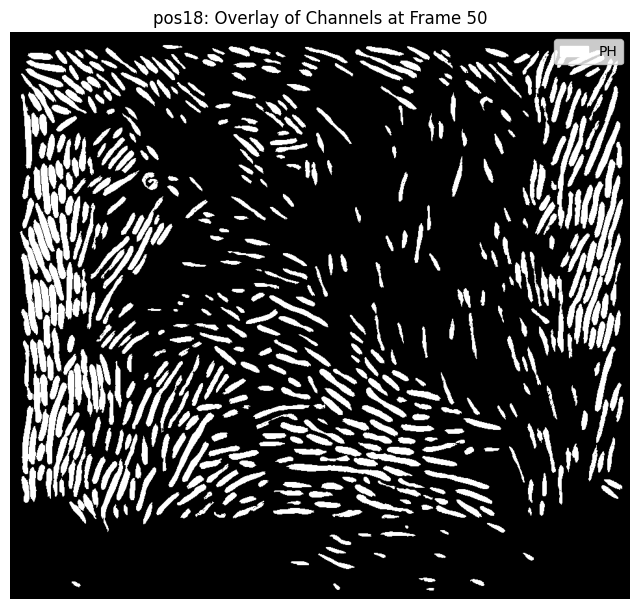

In [4]:
experiment_test.print_selected_frame(frame = 50)
experiment_test.print_selected_frame(frame = 50, color= [(255,255,255)], color_channels= "PH")


Here some code to run the full experiment

['pos6', 'pos1', 'pos8', 'pos15', 'pos12', 'pos9', 'pos7', 'pos13', 'pos14', 'pos18', 'pos11', 'pos16', 'pos2', 'pos5', 'pos17', 'pos10', 'pos4', 'pos3']
Loading sample at position pos1 for group YFP
Loading sample at position pos1 for group CFP
Loading sample at position pos1 for group PH
Loading sample at position pos2 for group YFP
Loading sample at position pos2 for group CFP
Loading sample at position pos2 for group PH
Loading sample at position pos3 for group YFP
Loading sample at position pos3 for group CFP
Loading sample at position pos3 for group PH
Loading sample at position pos4 for group YFP
Loading sample at position pos4 for group CFP
Loading sample at position pos4 for group PH
Loading sample at position pos5 for group YFP
Loading sample at position pos5 for group CFP
Loading sample at position pos5 for group PH
Loading sample at position pos6 for group YFP
Loading sample at position pos6 for group CFP
Loading sample at position pos6 for group PH
Loading sample at positi

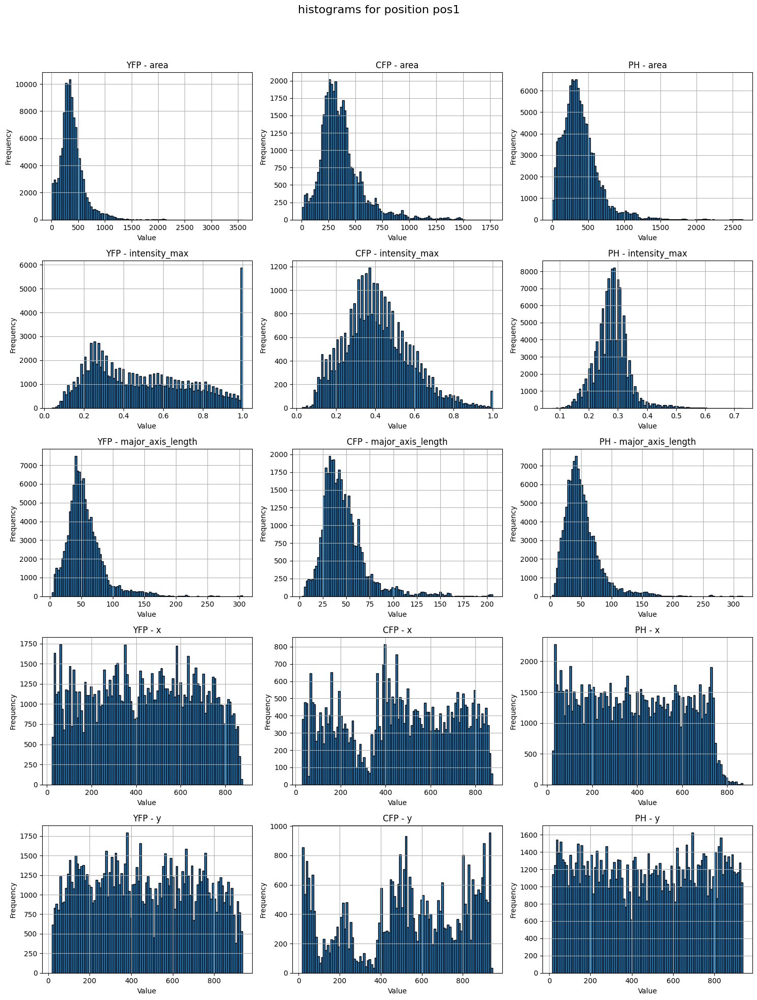

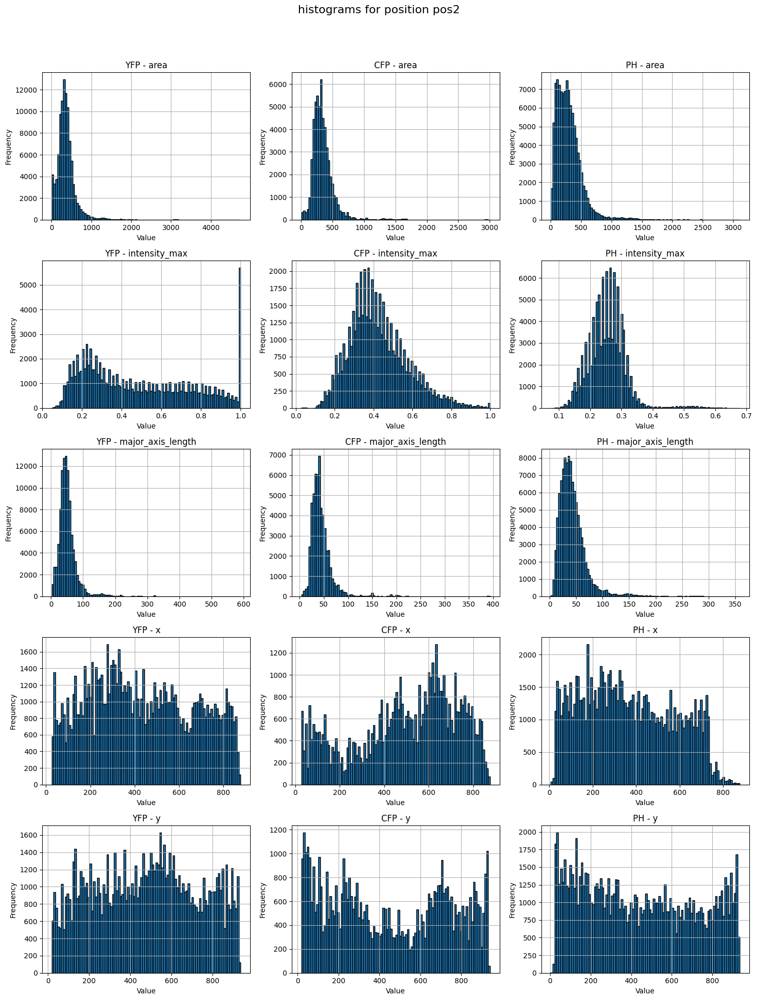

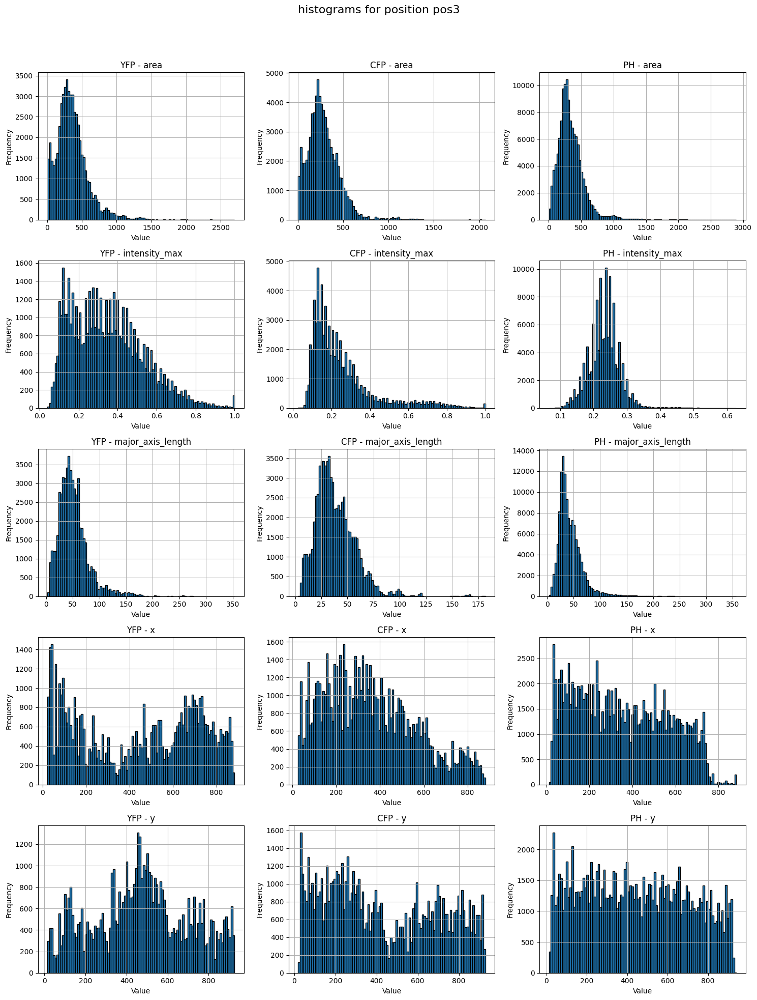

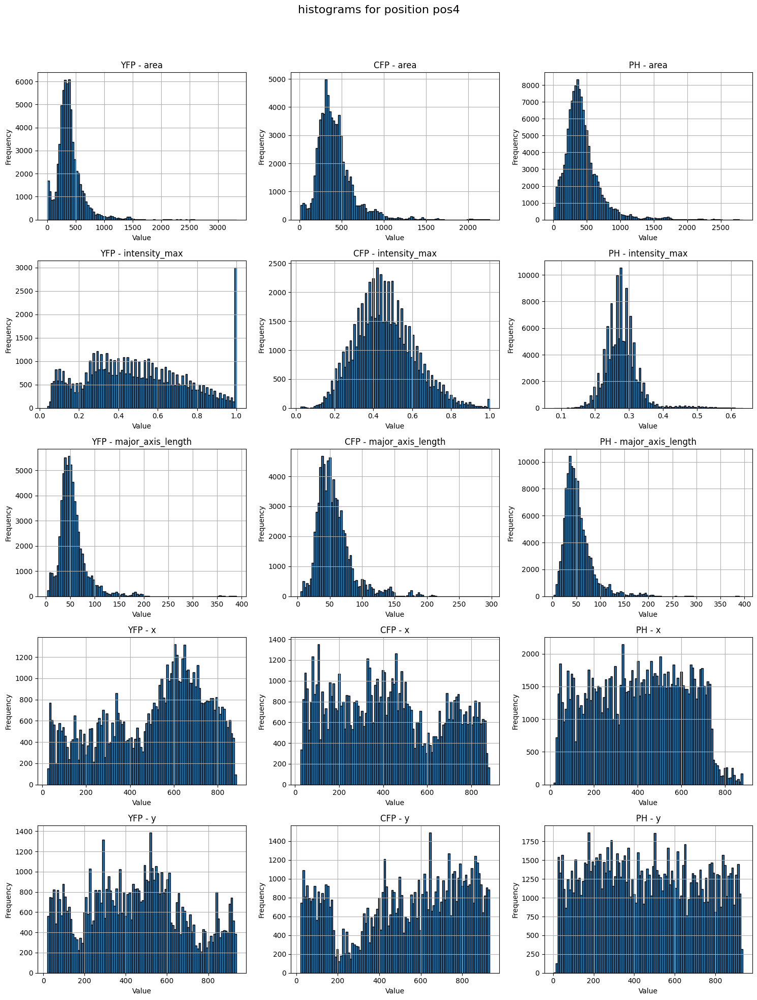

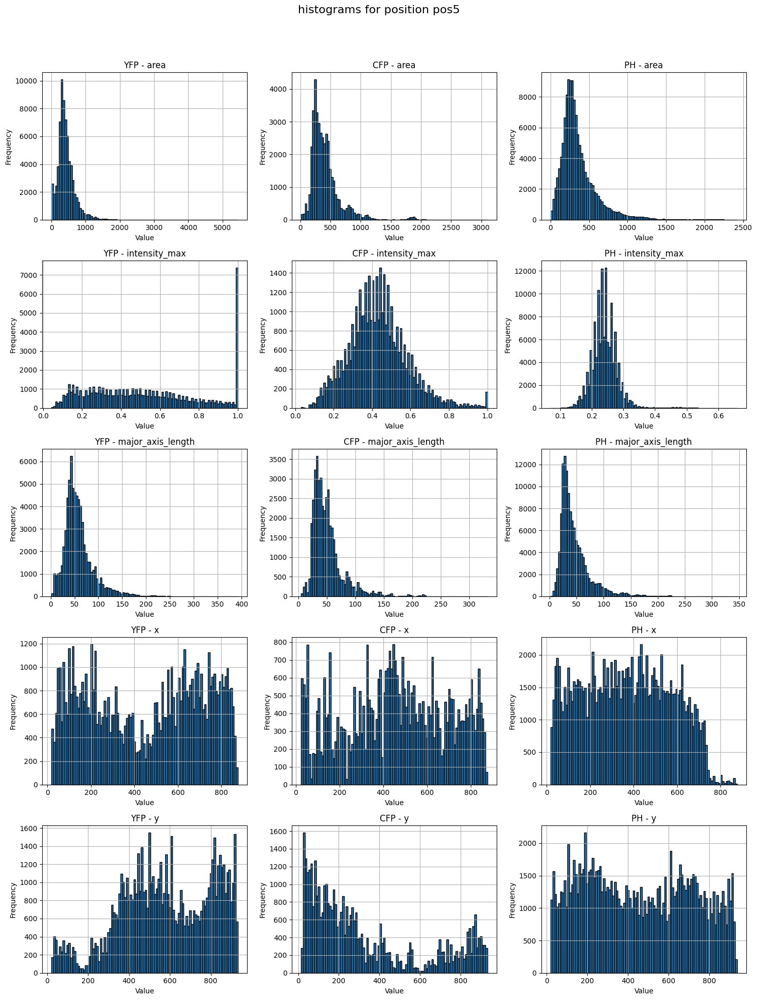

...

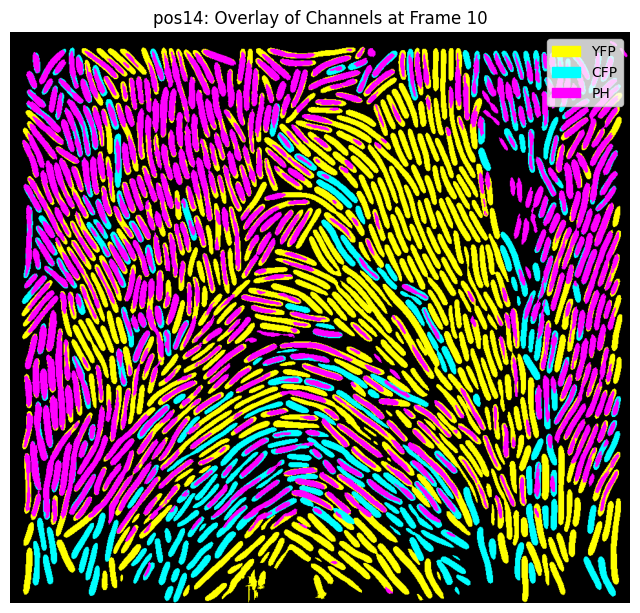

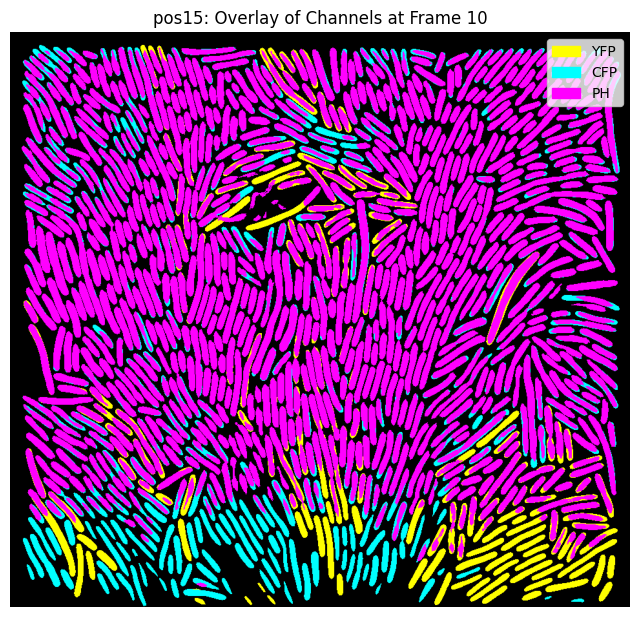

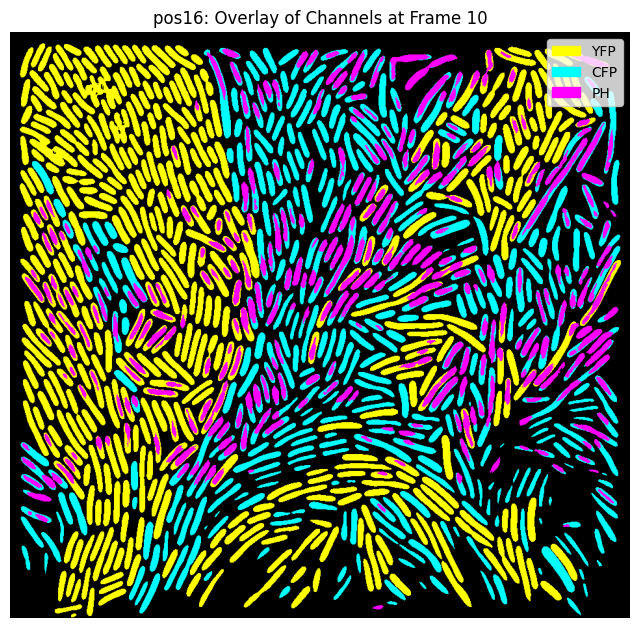

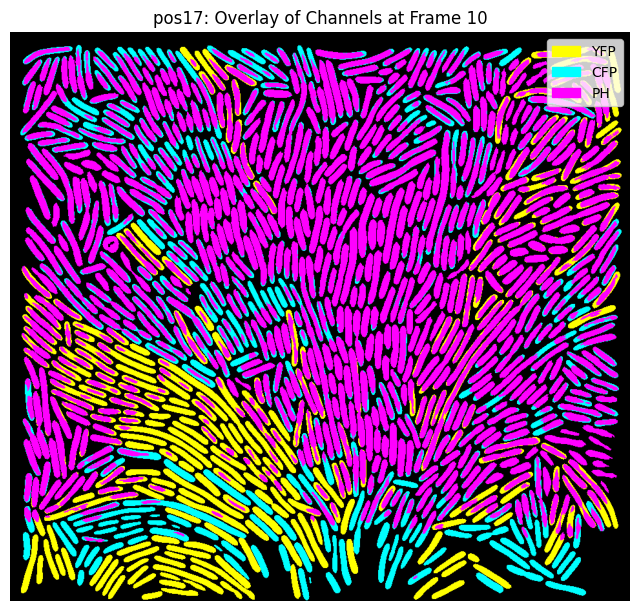

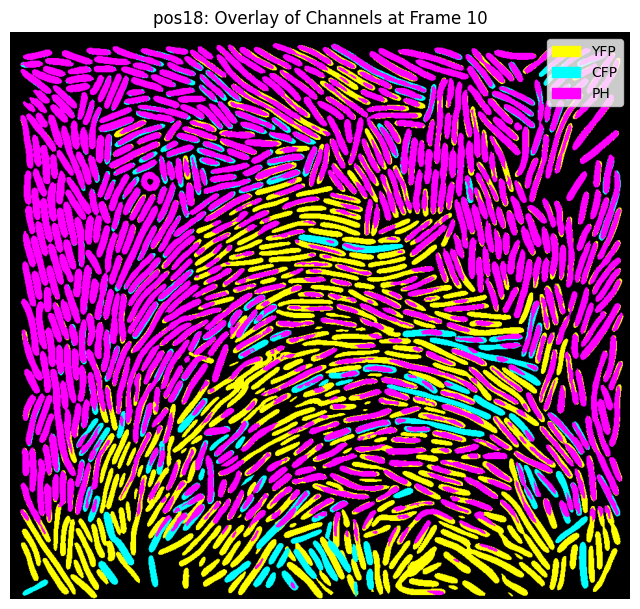

Filtering out trackID with less than 3 occurences
Calculate growth rate for trackID measured with major_axis_length over an integration window of 3


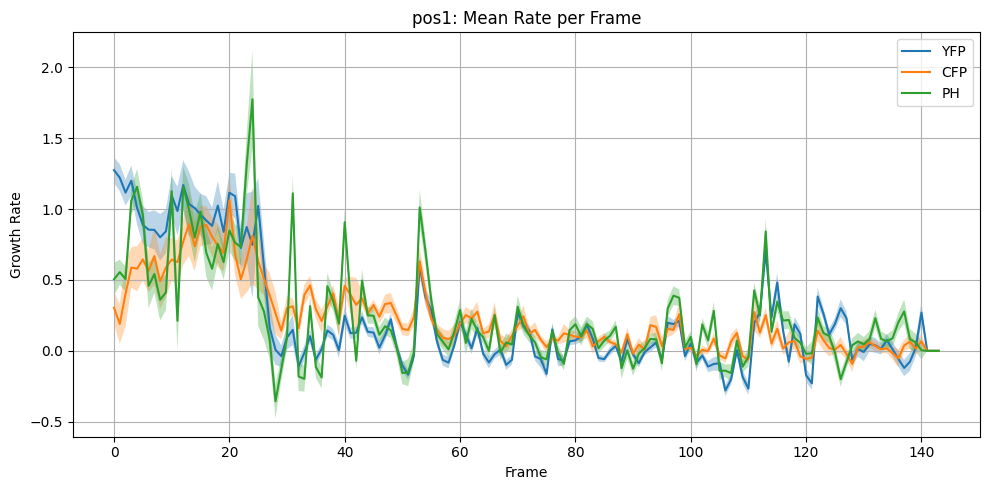

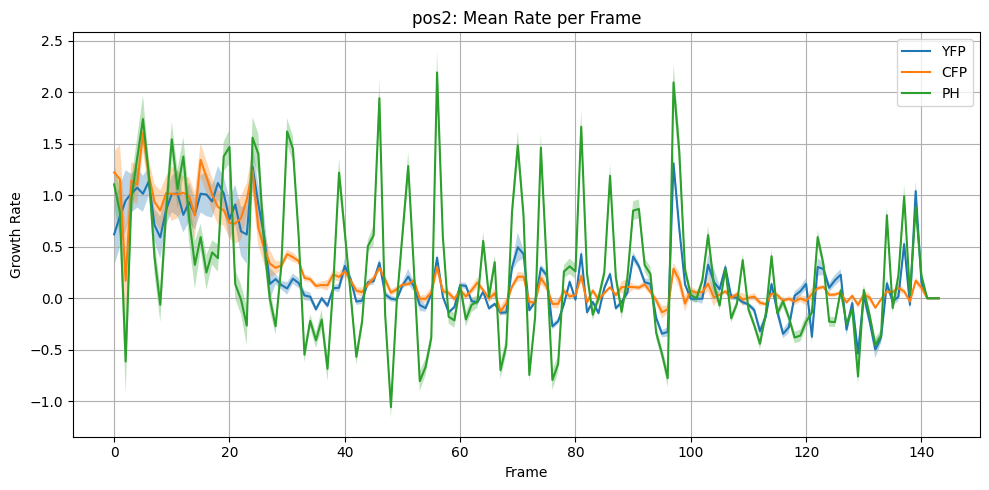

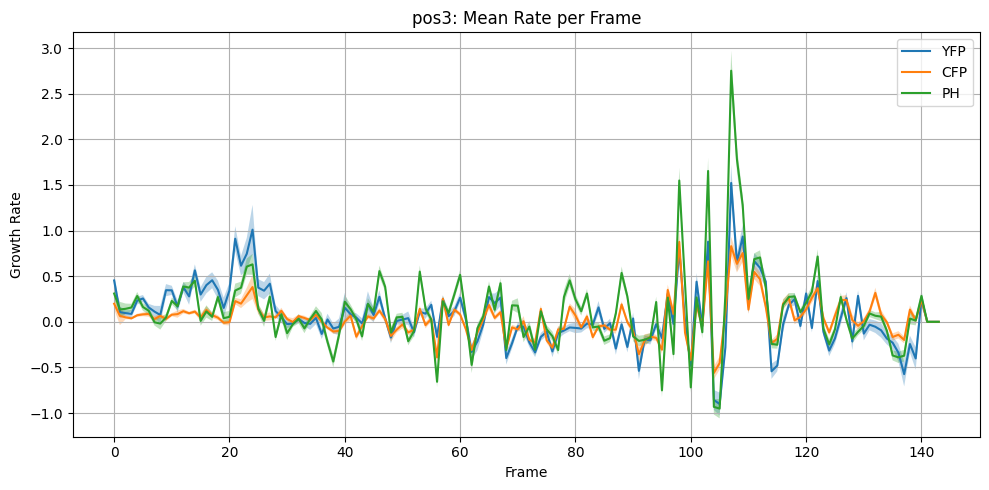

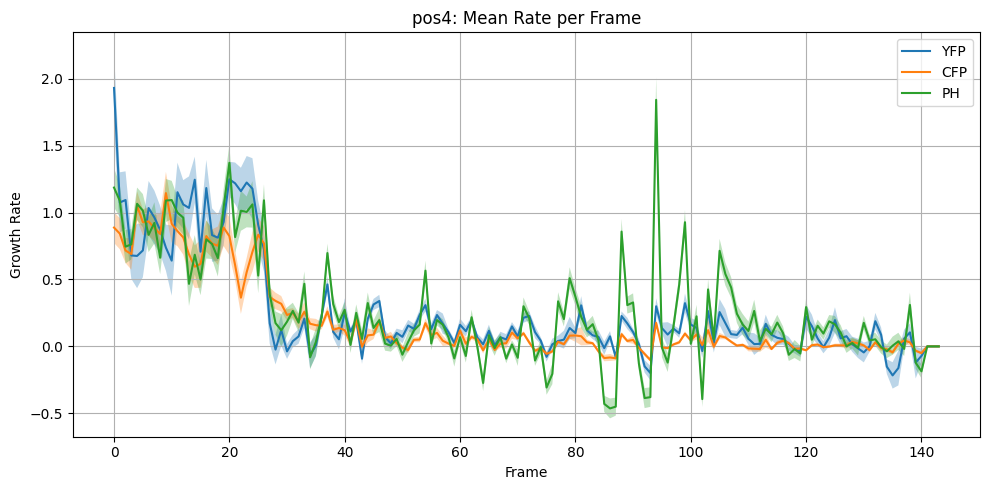

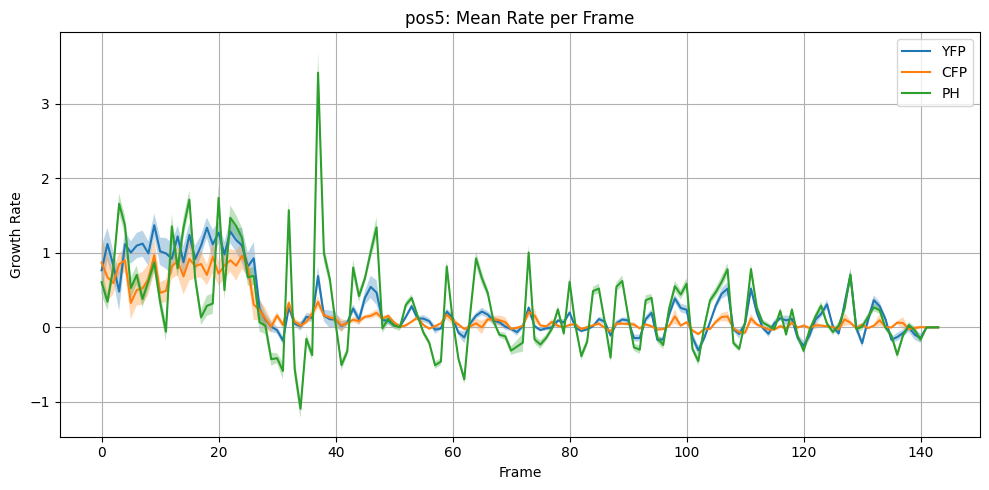

...

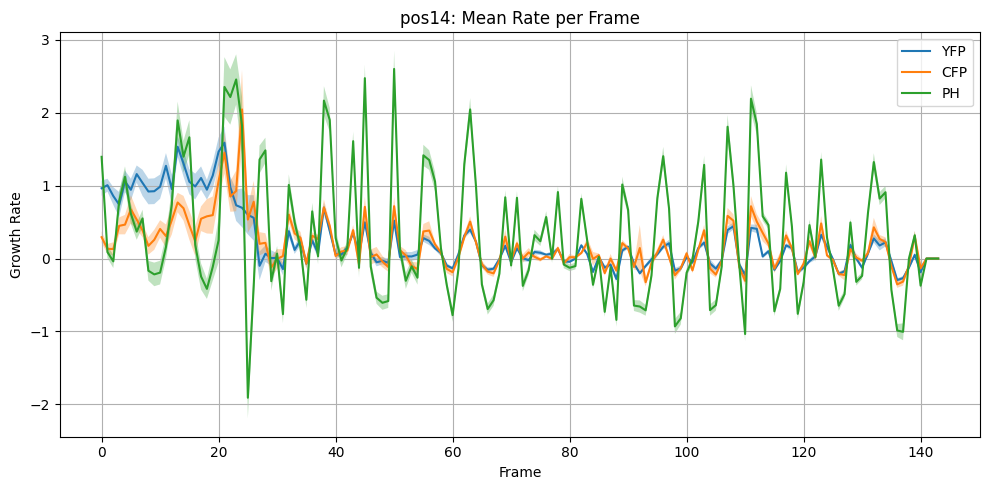

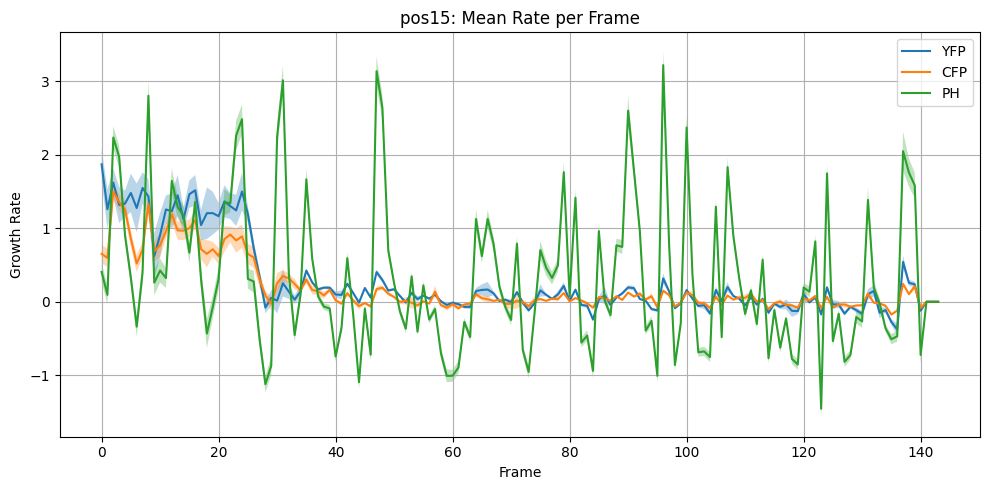

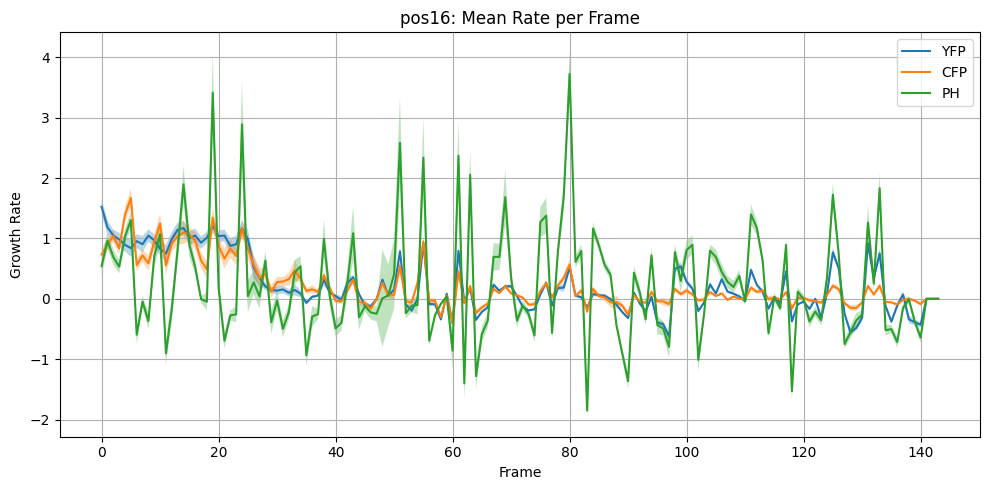

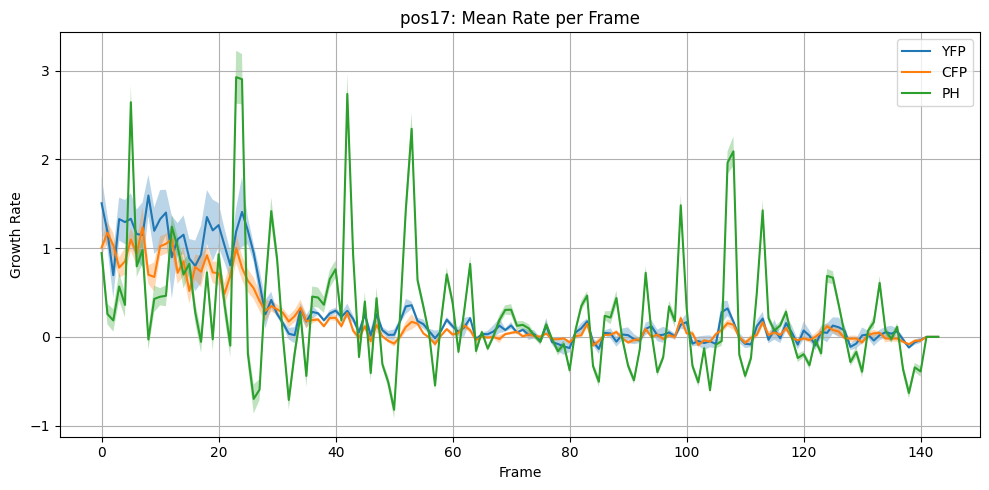

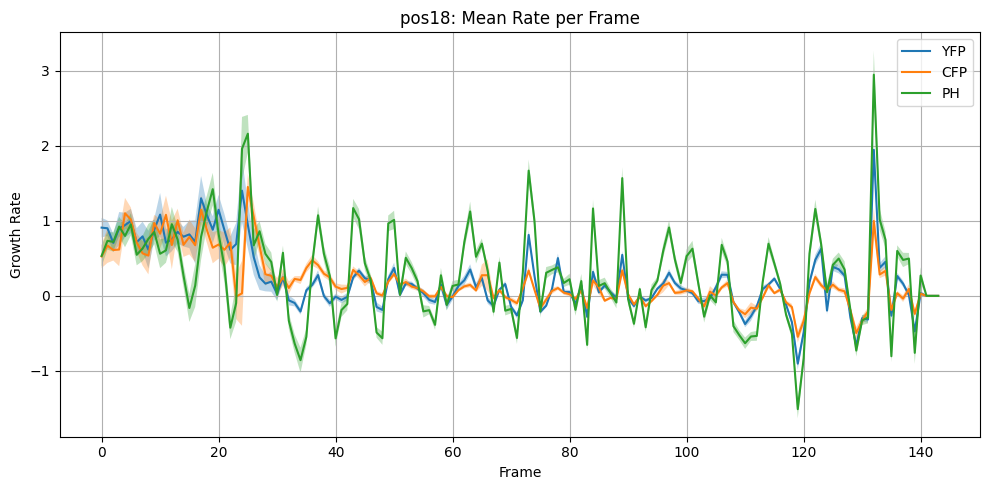

Fuseing all exisiting positions into a single position with the name fused


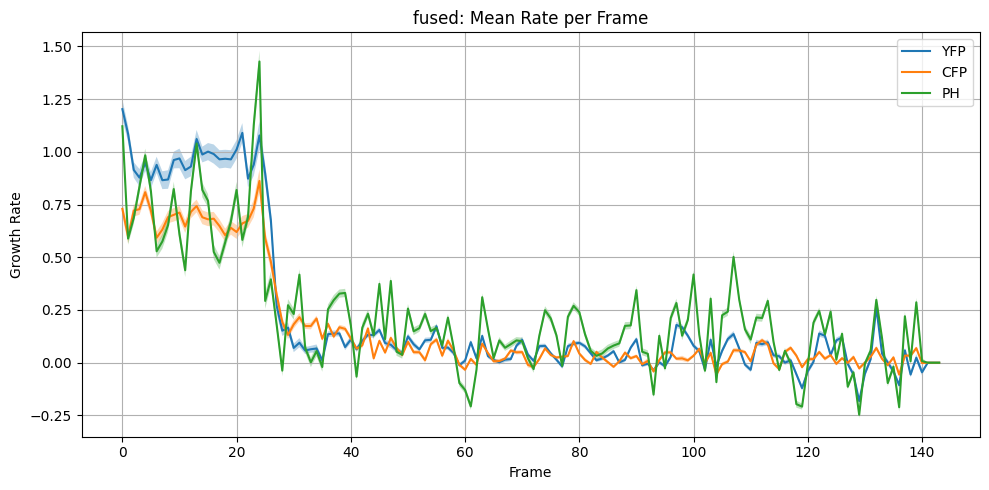

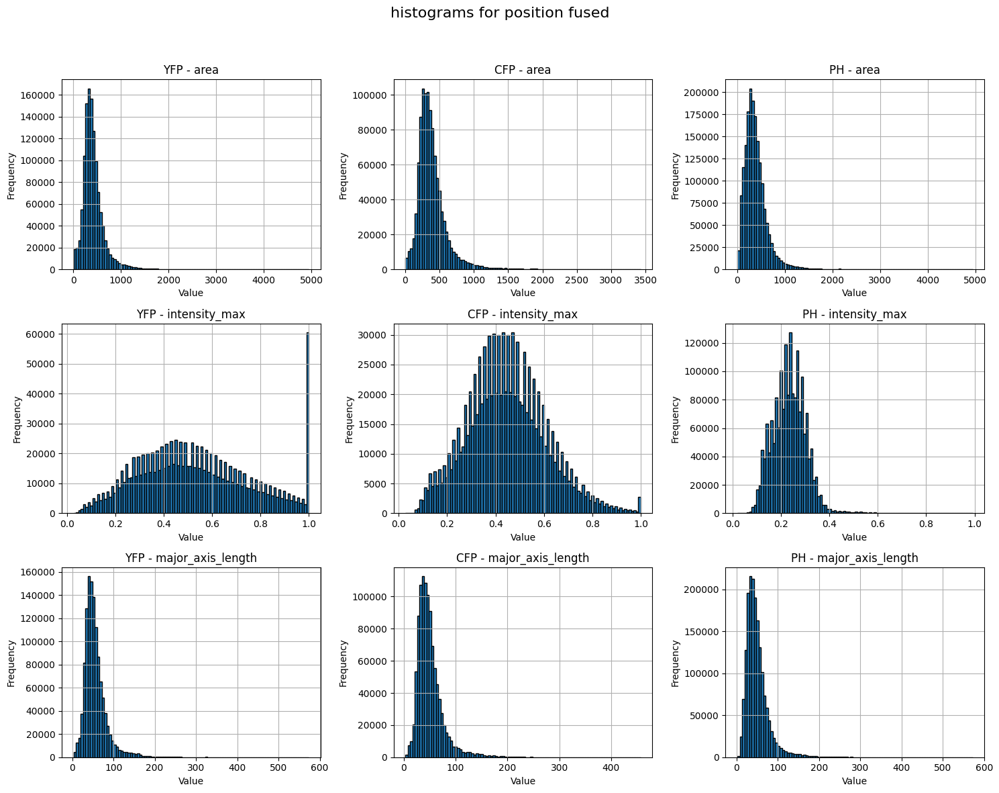

FluidExperiment with path: /Users/lukasv/DATA/midap/FluidPhage_REP1_results
1 positions: fused
3 color channels: YFP, CFP, PH
length of experiment is consistent: 143
experiment has consistent headers: Unnamed: 0, globalID, frame, labelID, trackID, lineageID, trackID_d1, trackID_d2, split, trackID_mother, first_frame, last_frame, area, edges_min_row, edges_min_col, edges_max_row, edges_max_col, intensity_max, intensity_mean, intensity_min, minor_axis_length, major_axis_length, x, y



In [6]:

groups = ["YFP","CFP","PH"]
experiment = FluidExperiment(path_experiment, color_channels= groups)
print(experiment)

#some SQ examples
experiment.print_QC_histograms(columns= ["area", "intensity_max", "major_axis_length","x","y"],color_channel = "pos6")

experiment.print_selected_frame(10)

#pre processing
experiment.filter_tracks(min_occurences=3)
experiment.calculate_growth_rate(integration_window = 3)
#experiment.calculate_densities()  #adds densities of neighbors
#experiment.print_QC_histograms(columns= ["density_YFP", "density_CFP"], position= "pos6")
experiment.plot_rates()

#we create a copy of the experiment, and then fuse all the positions data into a single df (for combined plotting)
experiment_fused = FluidExperiment.from_copy(experiment)
experiment_fused.collapse_all_positions()
experiment_fused.plot_rates()
experiment_fused.print_QC_histograms(columns= ["area", "intensity_max", "major_axis_length"])
print(experiment_fused)



FluidExperiment with path: /Users/lukasv/DATA/midap/FluidPhage_REP1_results
18 positions: pos1, pos2, pos3, pos4, pos5, pos6, pos7, pos8, pos9, pos10, pos11, pos12, pos13, pos14, pos15, pos16, pos17, pos18
2 groups: CFP, YFP
length of experiment is consistent: 143
experiment has consistent headers: Unnamed: 0, globalID, frame, labelID, trackID, lineageID, trackID_d1, trackID_d2, split, trackID_mother, first_frame, last_frame, area, edges_min_row, edges_min_col, edges_max_row, edges_max_col, intensity_max, intensity_mean, intensity_min, minor_axis_length, major_axis_length, x, y

FluidExperiment with path: /Users/lukasv/DATA/midap/FluidPhage_REP1_results
1 positions: fused
2 groups: CFP, YFP
length of experiment is consistent: 143
experiment has consistent headers: Unnamed: 0, globalID, frame, labelID, trackID, lineageID, trackID_d1, trackID_d2, split, trackID_mother, first_frame, last_frame, area, edges_min_row, edges_min_col, edges_max_row, edges_max_col, intensity_max, intensity_mean

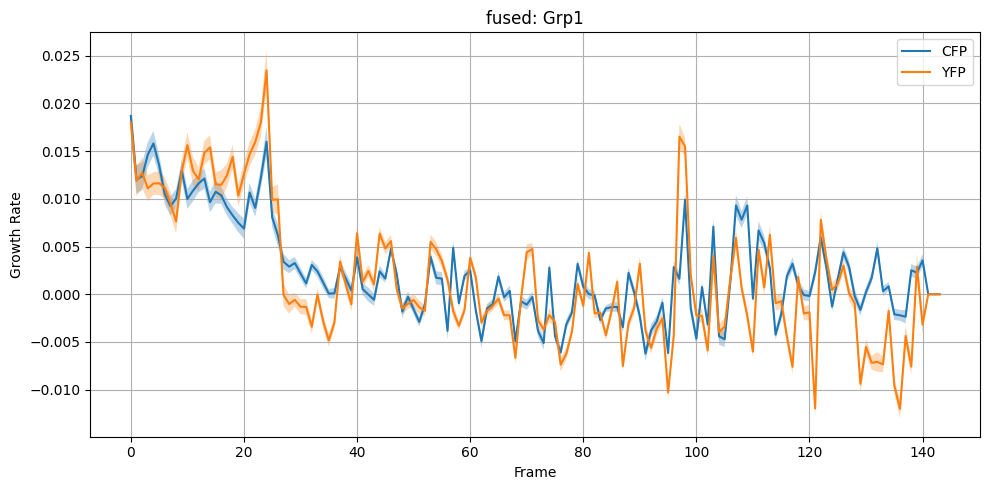

Dropping position pos1 from experiment
Dropping position pos2 from experiment
Dropping position pos3 from experiment
Dropping position pos4 from experiment
Dropping position pos5 from experiment
Dropping position pos6 from experiment
Dropping position pos13 from experiment
Dropping position pos14 from experiment
Dropping position pos15 from experiment
Dropping position pos16 from experiment
Dropping position pos17 from experiment
Dropping position pos18 from experiment
FluidExperiment with path: /Users/lukasv/DATA/midap/FluidPhage_REP1_results
6 positions: pos7, pos8, pos9, pos10, pos11, pos12
2 groups: CFP, YFP
length of experiment is consistent: 143
experiment has consistent headers: Unnamed: 0, globalID, frame, labelID, trackID, lineageID, trackID_d1, trackID_d2, split, trackID_mother, first_frame, last_frame, area, edges_min_row, edges_min_col, edges_max_row, edges_max_col, intensity_max, intensity_mean, intensity_min, minor_axis_length, major_axis_length, x, y

Fuseing all exisiti

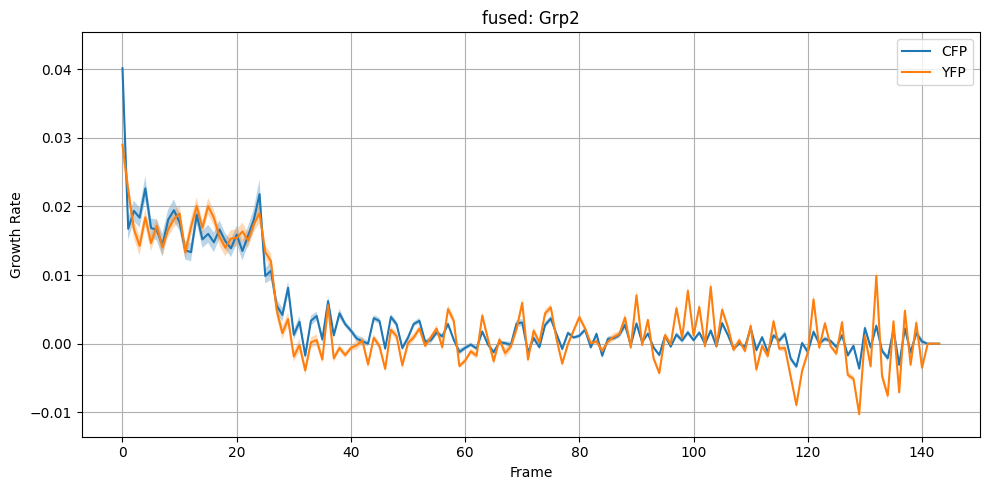

Dropping position pos1 from experiment
Dropping position pos2 from experiment
Dropping position pos3 from experiment
Dropping position pos4 from experiment
Dropping position pos5 from experiment
Dropping position pos6 from experiment
Dropping position pos7 from experiment
Dropping position pos8 from experiment
Dropping position pos9 from experiment
Dropping position pos10 from experiment
Dropping position pos11 from experiment
Dropping position pos12 from experiment
FluidExperiment with path: /Users/lukasv/DATA/midap/FluidPhage_REP1_results
6 positions: pos13, pos14, pos15, pos16, pos17, pos18
2 groups: CFP, YFP
length of experiment is consistent: 143
experiment has consistent headers: Unnamed: 0, globalID, frame, labelID, trackID, lineageID, trackID_d1, trackID_d2, split, trackID_mother, first_frame, last_frame, area, edges_min_row, edges_min_col, edges_max_row, edges_max_col, intensity_max, intensity_mean, intensity_min, minor_axis_length, major_axis_length, x, y

Fuseing all exisiti

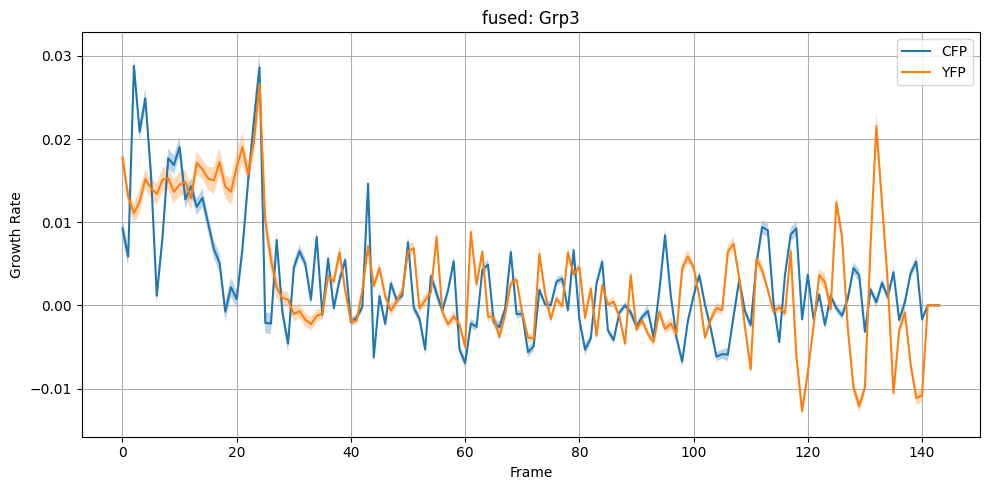

In [ ]:

print(experiment)



print(experiment_fused)


experiment_ctr = FluidExperiment.from_copy(experiment)
experiment_ctr.drop_positions(["pos" + str(i) for i in range(7,19)])

print(experiment_ctr)

experiment_ctr.collapse_all_positions()
experiment_ctr.plot_rates(title = "Grp1")

experiment_ctr = FluidExperiment.from_copy(experiment)
experiment_ctr.drop_positions(["pos" + str(i) for i in [1,2,3,4,5,6,13,14,15,16,17,18]])

print(experiment_ctr)

experiment_ctr.collapse_all_positions()
experiment_ctr.plot_rates(title = "Grp2")


experiment_ctr = FluidExperiment.from_copy(experiment)
experiment_ctr.drop_positions(["pos" + str(i) for i in [1,2,3,4,5,6,7,8,9,10,11,12]])

print(experiment_ctr)

experiment_ctr.collapse_all_positions()
experiment_ctr.plot_rates(title = "Grp3")

